In [1]:
import os
import pickle
import collections
from pathlib import Path

import warnings
warnings.filterwarnings("ignore")

from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import probscale
import seaborn


from IPython.display import display, HTML

#####################################################
# dataset files
#####################################################
data_raw_path = '../physionet.org/files/hirid/1.1.1/raw_stage/observation_tables_parquet'
data_merged_path = '../physionet.org/files/hirid/1.1.1/merged_stage/merged_stage_parquet'
data_imputed_path = '../physionet.org/files/hirid/1.1.1/imputed_stage/imputed_stage_parquet'

patient_info_file = '../physionet.org/files/hirid/1.1.1/reference_data/general_table.csv'
variable_file = '../physionet.org/files/hirid/1.1.1/reference_data/hirid_variable_reference.csv'
apache_group_file = '../processed/apache_groups.csv'

variable_table = pd.read_csv(variable_file)

In [2]:
# process selected pharma and physio data dict

# selected_pharma_file = '../processed/HiRID_selected_variables-input_dict.csv'
# selected_pharma = pd.read_csv(selected_pharma_file)
# selected_physio_file = '../processed/HiRID_selected_variables-output_dict.csv'
# selected_physio = pd.read_csv(selected_physio_file)

# datasheet = pd.read_csv('../processed/helper_physio_dict_preprocess.csv')
# selected_physio_final = pd.read_csv('../processed/HiRID_selected_variables-output_to_be_processed.csv')

# # delete variables with no occurences or unclear meaning
# selected_physio_final = selected_physio_final.drop(
#     selected_physio_final[~selected_physio_final['variableid'].isin(datasheet['variableid'])].index
# ).reset_index(drop=True)

# # label variebles which are set by medical staff
# selected_physio_final['isSetting'] = 0
# selected_physio_final.loc[
#     selected_physio_final['variableid'].isin(datasheet.loc[datasheet['is_setting']==1, 'variableid']), 
#     'isSetting'
# ]=1

# for vid in datasheet['variableid'].values:
#     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'type'] = \
#         datasheet.loc[datasheet['variableid']==vid, 'type'].item()
#     # Shape: B-bell, H-halfBell, M-mixGaussian, D-discrete
#     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'shape'] = \
#         datasheet.loc[datasheet['variableid']==vid, 'shape'].item()
#     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'unit'] = \
#         variable_table.loc[(variable_table['Source Table']=='Observation') 
#                            & (variable_table['ID']==vid), 'Unit'].item()

# # duplicated variables to be merged or added up
# merge_items = {
#     'merge': [
#         [300, 310],
#         [4000, 8280],
#         [24000835, 24000866],
#         [30005010, 30005110],
#     ],
#     'add': [
#         [10010020, 10010070, 10010071, 10010072],
#     ],
# }

# # assign unique ID
# uid = 1
# for vid in tqdm(selected_physio_final['variableid'].values):
#     dup = False
#     for k in merge_items:
# #         print(k)
#         for vlist in merge_items[k]:
# #             print(vlist)
#             if vid in vlist:
#                 dup = True
#                 tmp = selected_physio_final[selected_physio_final['variableid'].isin(vlist)]
# #                 print(tmp[['variableid', 'uid']])
#                 if tmp['uid'].notnull().sum() == 0:
#                     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'uid'] = uid
#                     uid += 1
# #                     print(f'{vid}: {uid}')
#                     continue
#                 else:
#                     uid_exist = tmp.loc[tmp['uid'].notnull(), 'uid'].unique().item()
#                     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'uid'] = uid_exist
# #                     print(selected_physio_final[selected_physio_final['variableid']==vid])
#                     continue
# #     print(f'after for loop: {vid}, {uid}')
#     if not dup:
#         selected_physio_final.loc[selected_physio_final['variableid']==vid, 'uid'] = uid
#         uid += 1
# selected_physio_final['uid'] = selected_physio_final['uid'].astype(int)

# selected_physio_final.to_csv('../processed/HiRID_selected_variables-output_processed.csv')

In [2]:
selected_pharma_file = '../processed/HiRID_selected_variables-input_dict.csv'
selected_pharma = pd.read_csv(selected_pharma_file)

# duplicated variables to be merged or added up
merge_items = {
    'merge': [
        [300, 310],
        [4000, 8280],
        [24000835, 24000866],
        [30005010, 30005110],
    ],
    'add': [
        [10010020, 10010070, 10010071, 10010072],
    ],
}

selected_physio = pd.read_csv('../processed/HiRID_selected_variables-output_processed.csv')

uid_dict = {}
for index, row in selected_physio.iterrows():
    uid_dict[row['variableid']] = row['uid']

In [4]:
# print('Loading data...')

# # merge APACHE II & IV categories
# apache_table = pd.read_csv(apache_group_file)
# apache_table = apache_table.drop(apache_table[apache_table['II'] == 'IV'].index)
# apache_table['II'] = apache_table['II'].astype(int)
# apache_dict = {}
# for apache_name in apache_table['Name'].unique():
#     apache_dict[apache_name] = apache_table.loc[apache_table['Name']==apache_name, 'II'].values.tolist()

# # load patient data
# patient_info = pd.read_csv(patient_info_file)
# patient_info['admissiontime'] = pd.to_datetime(patient_info['admissiontime'])
# patient_info['los'] = -1

# pharma_path = '../physionet.org/files/hirid/1.1.1/raw_stage/pharma_records_parquet'
# pharma_data = pd.read_parquet(os.path.join(pharma_path, 'pharma_records', 'parquet'))
# patient_data = pd.read_parquet(os.path.join(data_raw_path, 'observation_tables', 'parquet'))


# # patient with entries of selected pharma
# pid_with_selected_pharma = pharma_data.loc[pharma_data['pharmaid'].isin(selected_pharma['variable_id']), 'patientid'].astype(int).unique().tolist()
# pickle.dump(pid_with_selected_pharma, open('../processed/pid_with_selected_pharma.p', 'wb'))


# #####################################################
# # Grouping patient with APACHE
# #####################################################
# print('Grouping patient with APACHE...')
# pid_apache_group = {}
# for apache in tqdm(apache_dict):
#     patient_apache = patient_data.loc[(patient_data['variableid'].isin([9990002, 9990004])) & (patient_data['value'].isin(apache_dict[apache]))]
#     pid_apache_group[apache] = patient_apache['patientid'].unique()
# pickle.dump(pid_apache_group, open('../processed/pid_apache_group.p', 'wb'))

# pid_apache_with_selected_pharma = {}
# for apache in tqdm(apache_dict):
#     pid_apache_with_selected_pharma[apache] = list(set(pid_apache_group[apache]).intersection(set(pid_with_selected_pharma)))
# pickle.dump(pid_apache_with_selected_pharma, open('../processed/pid_apache_group_with_selected_pharma.p', 'wb'))
# print('Grouping patient with APACHE...finished')

# # remove pid with multiple apache entries
# pid_valid = []
# for apache in pid_apache_with_selected_pharma:
#     pid_valid += pid_apache_with_selected_pharma[apache]
# print(f'PIDs with selected pharma: {len(pid_valid)}')
# pid_duplicates = [item for item, count in collections.Counter(pid_valid).items() if count > 1]
# pid_valid = set(pid_valid)
# print(f'Unique PIDs with selected pharma: {len(pid_valid)}')
# pid_valid = [item for item in pid_valid if item not in pid_duplicates]
# print(f'PIDs with selected pharma and one single APACHE group: {len(pid_valid)}')

# # dataset with selected pids and variables
# pharma_data_selected = pharma_data[(pharma_data['patientid'].isin(pid_valid))
#                                    & (pharma_data['pharmaid'].isin(selected_pharma['variable_id']))]
# patient_data_selected = patient_data.loc[(patient_data['patientid'].isin(pid_valid))
#                                          & (patient_data['variableid'].isin(selected_physio['variableid']))]

# # remove pid without discharge status
# for patientid in patient_info[patient_info['discharge_status'].isnull()]['patientid'].unique():
#     try:
#         pid_valid.remove(patientid)
#     except:
#         pass
# print(f'PIDs - removing unknown discharge status: {len(pid_valid)}')

# # remove pid with NAN data entries
# for patientid in patient_data_selected.loc[patient_data_selected['value'].isnull()]['patientid'].unique():
#     try:
#         pid_valid.remove(patientid)
#     except:
#         pass
# print(f'PIDs - removing NAN patient data entries: {len(pid_valid)}')

# # pid APACHE group with valid pids
# count = []
# pid_group_valid = {}
# for apache in pid_apache_with_selected_pharma:
#     pid_group_valid[apache] = list(set(pid_apache_with_selected_pharma[apache]).intersection(set(pid_valid)))
#     count += pid_group_valid[apache]
# print('Valid PID number: ', len(set(count)))

# patient_info_selected = patient_info[patient_info['patientid'].isin(pid_valid)]
# patient_info_selected['APACHE'] = 'None'
# for pid in tqdm(pid_valid):
#     pdata = patient_data_selected[patient_data_selected['patientid'] == pid]
#     los = pdata['datetime'].max() - patient_info_selected.loc[
#         patient_info_selected['patientid'] == pid, 'admissiontime'].item()
#     patient_info_selected.loc[patient_info_selected['patientid'] == pid, 'los'] = los
#     for apache in pid_group_valid:
#         if pid in pid_group_valid[apache]:
#             patient_info_selected.loc[patient_info_selected['patientid']==pid, 'APACHE'] = apache

# patient_info_valid = patient_info_selected[patient_info_selected['patientid'].isin(pid_valid)].reset_index(drop=True)
# pharma_data_valid = pharma_data_selected[pharma_data_selected['patientid'].isin(pid_valid)].reset_index(drop=True)
# patient_data_valid = patient_data_selected[patient_data_selected['patientid'].isin(pid_valid)].reset_index(drop=True)

# # remove prelimitary lab values
# patient_data_valid = patient_data_valid.drop(patient_data_valid[patient_data_valid['type']=='P'].index).reset_index(drop=True)

# print(f"Patient info: {patient_info_valid['patientid'].unique().shape}, {patient_info_valid.shape}")
# print(f"Pharma data: {pharma_data_valid['patientid'].unique().shape}, {pharma_data_valid.shape}")
# print(f"Physio data: {patient_data_valid['patientid'].unique().shape}, {patient_data_valid.shape}")

# pickle.dump(pid_valid, open('../processed/pid_valid.p', 'wb'))
# pickle.dump(pid_group_valid, open('../processed/pid_group_valid.p', 'wb'))
# pickle.dump(patient_info_valid, open('../processed/patient_info_valid.p', 'wb'))
# pickle.dump(pharma_data_valid, open('../processed/pharma_data_valid.p', 'wb'))
# pickle.dump(patient_data_valid, open('../processed/patient_data_valid.p', 'wb'))

Loading data...
Grouping patient with APACHE...


100%|█████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 167.88it/s]


Grouping patient with APACHE...finished
PIDs with selected pharma: 35592
Unique PIDs with selected pharma: 30717
PIDs with selected pharma and one single APACHE group: 26307
PIDs - removing unknown discharge status: 26117
PIDs - removing NAN patient data entries: 24652
Valid PID number:  24652


100%|██████████████████████████████████████████████████████████████████████| 24652/24652 [1:14:01<00:00,  5.55it/s]


Patient info: (24652,), (24652, 7)
Pharma data: (24652,), (6291349, 14)
Physio data: (24652,), (234523057, 8)


In [3]:
pid_list = pickle.load(open('../processed/pid_valid.p', 'rb'))
pid_group = pickle.load(open('../processed/pid_group_valid.p', 'rb'))
patient_info = pickle.load(open('../processed/patient_info_valid.p', 'rb'))
pharma_data = pickle.load(open('../processed/pharma_data_valid.p', 'rb'))
patient_data = pickle.load(open('../processed/patient_data_valid.p', 'rb'))

print(len(pid_list), patient_info.shape)

selected_pharma = selected_pharma.drop(
    selected_pharma[~selected_pharma['variable_id'].isin(pharma_data['pharmaid'].unique())].index
).reset_index(drop=True)

24652 (24652, 7)


In [5]:
COL_INFO_NUM = ['age', 'los']
COL_INFO_CAT = ['sex', 'discharge_status', 'APACHE']
COL_PHARMA = selected_pharma['variable_id'].tolist()
COL_PHYSIO_NUM = selected_physio.loc[selected_physio['type']=='n', 'variableid'].tolist()
COL_PHYSIO_CAT= selected_physio.loc[selected_physio['type']=='c', 'variableid'].tolist()
COL_PHYSIO_SETTING = selected_physio.loc[selected_physio['isSetting']==1, 'variableid'].tolist()

In [6]:
# patient information
df_info = pd.DataFrame()

df_info = pd.concat((df_info, patient_info['patientid']), axis=1)
for col in COL_INFO_NUM:
    df_info = pd.concat((df_info, patient_info[col]), axis=1)
for col in COL_INFO_CAT:
    df_info = pd.concat((df_info, pd.get_dummies(patient_info[col], prefix=col)), axis=1)
df_info['los'] = df_info['los'].map(lambda x: x.days + x.seconds/3600/24)

df_info

,patientid,age,los,sex_F,sex_M,discharge_status_alive,discharge_status_dead,APACHE_Cardiovascular,APACHE_Gastrointestinal,APACHE_Hematology,...,APACHE_Surgical Gastrointestinal,APACHE_Surgical Gynecology,APACHE_Surgical Neurological,APACHE_Surgical Orthopedics,APACHE_Surgical Respiratory,APACHE_Surgical Trauma,APACHE_Surgical Urogenital,APACHE_Surgical others,APACHE_Trauma,APACHE_Urogenital
0,1,75,0.646528,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,80,8.361111,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,3,55,0.754861,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,5,20,2.888889,0,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,6,65,0.800000,1,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24647,33898,75,9.521528,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24648,33899,60,0.968762,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24649,33901,70,6.602153,0,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
24650,33902,75,0.764583,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# pharma data
df_pharma = pd.DataFrame(columns=['patientid'] + COL_PHARMA)
df_pharma['patientid'] = patient_info['patientid'].values

for pid in tqdm(pid_list):
    for pharma in COL_PHARMA:
        data = pharma_data.loc[(pharma_data['patientid']==pid) & (pharma_data['pharmaid']==pharma)]
        dosage = data['givendose'].sum()
#         print(f"{pid} - {pharma}: {dosage}")
        df_pharma.loc[(df_pharma['patientid']==pid), pharma] = dosage

 12%|████████▏                                                            | 2905/24652 [1:06:48<8:25:48,  1.40s/it]

In [20]:
df_pharma

,patientid,1000100,1000743,1000050,1000201,1000462,1000656,1000657,1000658,71,...,1000070,1000687,1000290,1000291,1000292,1000170,1000540,1000453,1000193,1000571
0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.0,0.0,0.0,0.0,0.0,0.0,625.140015,60.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0.0,750.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24647,33898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24648,33899,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24649,33901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24650,33902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
def percentile(n):
    def percentile_(x):
        return np.nanpercentile(x, n)
    percentile_.__name__ = 'percentile_%s' % n
    return percentile_


# physio data
df_physio = pd.DataFrame()

df_physio = pd.concat((df_physio, patient_info['patientid']), axis=1)
for col in COL_PHYSIO_NUM:
    feat = patient_data.groupby(['variableid']).agg({'value': ['mean', 'std', 'median', 'min', 'max',
                                                                  percentile(0.1),
                                                                  percentile(1), percentile(5),
                                                                  percentile(95), percentile(99),
                                                                  percentile(99.9)]})
    df_physio = pd.concat((df_physio, patient_data[col]), axis=1)
    
    
for col in COL_PHYSIO_CAT:
    df_physio = pd.concat((df_physio, pd.get_dummies(patient_data[col], prefix=col)), axis=1)

,patientid,pharmaid,givenat,enteredentryat,givendose,cumulativedose,fluidamount_calc,cumulfluidamount_calc,doseunit,route,infusionid,typeid,subtypeid,recordstatus
0,148,251,2183-05-12 13:02:00.000,2183-05-12 13:57:02.870,1.000000,1.000000,1.000000,1.000000,mg,iv-inj,1997059,1,8.0,780
1,148,251,2183-05-12 13:14:00.000,2183-05-12 13:57:18.620,1.000000,1.000000,1.000000,1.000000,mg,iv-inj,900965,1,8.0,780
2,148,1000421,2183-05-13 08:10:00.000,2183-05-13 08:23:20.166,2000.000000,2000.000000,4.000000,4.000000,mg,iv-inf,1327904,1,8.0,780
3,229,1000393,2116-12-15 17:00:00.000,2116-12-15 17:00:35.143,20.000000,20.000000,0.000000,0.000000,mmol,p os,1645103,1,8.0,780
4,229,1000393,2116-12-15 23:00:00.000,2116-12-15 23:32:23.013,20.000000,20.000000,0.000000,0.000000,mmol,p os,2189937,1,8.0,780
5,229,1000393,2116-12-16 05:00:00.000,2116-12-16 05:12:02.740,20.000000,20.000000,0.000000,0.000000,mmol,p os,1196661,1,8.0,780
6,229,1000393,2116-12-16 11:00:00.000,2116-12-16 11:03:26.550,0.000000,0.000000,0.000000,0.000000,mmol,p os,53447,1,8.0,544
7,307,1000699,2128-02-16 19:45:00.000,2128-02-16 19:45:42.583,60.000000,60.000000,3.000000,3.000000,mg,iv-inj,122377,1,8.0,780
8,307,1000658,2128-02-16 19:47:00.000,2128-02-16 19:50:37.800,20.000000,20.000000,2.000000,2.000000,µg,cv-inj,1970600,1,8.0,780
9,307,208,2128-02-16 20:17:00.000,2128-02-16 20:17:40.853,0.000000,0.000000,0.000000,0.000000,mg,iv-inf,1126852,1,8.0,524


In [9]:
for vid in COL_PHYSIO_CAT:
    num_cat = patient_data.loc[patient_data['variableid']==vid, 'value'].unique().shape[0]
    print(f"{vid} - {selected_physio[selected_physio['variableid']==vid]['variablename'].item()}: {num_cat}")

15001525 - Oxygen administration by nasal cannula: 16
3845 - Ventilator mode: 13
15001552 - Ventilator Airway Code: 6
15001166 - Circadian rhythm: 13


In [22]:
df_
for pid in pid_list:
pharma = pharma_data_all[pharma_data_all['patientid']==pid]
urine = patient_data.loc[(patient_data['patientid']==pid) & (patient_data['variableid'].map(uid_dict)==31)]
drain = patient_data.loc[(patient_data['patientid']==pid) & (patient_data['variableid'].map(uid_dict)==32)]
fb = patient_data.loc[(patient_data['patientid']==pid) & (patient_data['variableid'].map(uid_dict)==33)]

In [32]:
df_fluid = pd.DataFrame(columns=['timestamp', 'pharma', 'volume_in', 'urine', 'drain', 'volume_out'])
ts = []
for df in [pharma, fb, urine, drain]:
    try:
        ts += df['datetime'].tolist()
    except:
        ts += df['givenat'].tolist()
print(len(ts))
print(len(set(ts)))

330
197


In [29]:
fb['datetime'].dtype, pharma['givenat'].dtype

(dtype('<M8[ns]'), dtype('<M8[ns]'))

In [34]:
pharma.shape, fb.shape

((124, 14), (201, 8))

In [41]:
ts1 = pharma['givenat'].tolist()
ts2 = fb['datetime'].tolist()

In [53]:
len(set(ts2).difference(set(ts1)))

76

In [45]:
len(set(ts1).intersection(set(ts2)))

121

In [46]:
set(ts1).difference(set(ts2))

set()

In [48]:
len(set(ts1))

121

In [51]:
[t for t in ts1 if ts1.count(t)>1]

[Timestamp('2197-04-03 20:07:00'),
 Timestamp('2197-04-03 20:07:00'),
 Timestamp('2197-04-03 20:23:00'),
 Timestamp('2197-04-03 20:23:00'),
 Timestamp('2197-04-04 02:00:00'),
 Timestamp('2197-04-04 02:00:00')]

In [56]:
pharma['cumulfluidamount_calc'].sum()

850.2830794497836

In [58]:
fb[~fb['datetime'].isin(pharma['givenat'])]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
583046285,2197-04-03 20:00:00.000,2197-04-03 20:47:24.780,1,8,,,13.833000,30005010
583046602,2197-04-03 20:35:00.000,2197-04-03 20:47:24.780,1,8,,,18.313555,30005010
583046603,2197-04-03 20:35:00.000,2197-04-03 20:43:52.930,1,8,,,225.320892,30005110
583046712,2197-04-03 20:47:00.000,2197-04-03 20:47:17.970,1,8,,,325.320892,30005110
583046999,2197-04-03 21:20:00.000,2197-04-03 21:20:19.380,1,8,,,628.813538,30005010
...,...,...,...,...,...,...,...,...
583051891,2197-04-04 10:23:50.450,2197-04-04 10:24:46.410,1,8,,,3223.946045,30005010
583051901,2197-04-04 10:26:09.540,2197-04-04 10:26:07.470,1,8,,,3224.023193,30005010
583051930,2197-04-04 10:32:00.000,2197-04-04 10:32:54.150,1,8,,,3544.275879,30005010
583051937,2197-04-04 10:33:00.000,2197-04-04 10:48:15.010,1,8,,,1999.557251,30005110


In [9]:
selected_physio[selected_physio['category'] == 'Fluid-balance']

,Unnamed: 0,variableid,variablename,category,unit,isSetting,type,shape,uid,is_setting,distribution_shape
32,32,10020000,Hourly urine volume,Fluid-balance,ml/h,NaN,n,NaN,31,0,B
33,33,10010020,Measurement of output from drain,Fluid-balance,ml,NaN,n,NaN,32,0,B
34,34,10010072,Measurement of output from drain,Fluid-balance,ml,NaN,n,NaN,32,0,B
35,35,10010070,Measurement of output from drain,Fluid-balance,ml,NaN,n,NaN,32,0,B
36,36,10010071,Measurement of output from drain,Fluid-balance,ml,NaN,n,NaN,32,0,B
37,37,30005010,Fluid balance,Fluid-balance,cummulative,NaN,n,NaN,33,0,H
38,38,30005110,Fluid balance,Fluid-balance,cummulative,NaN,n,NaN,33,0,H


In [7]:
selected_physio['category'].unique()

array(['Respiratory', 'Circulary', 'Cardiac markers', 'Activity',
       'Fluid-balance', 'Acid-Base balance', 'Renal', 'Inflammation'],
      dtype=object)

# Patient number per APACHE group

In [4]:
for apache in pid_group:
    print(f'{apache}:\t{len(pid_group[apache])}')

Cardiovascular:	3345
Pulmonary:	1910
Gastrointestinal:	1297
Neurological:	3786
Sepsis:	494
Trauma:	983
Metabolic/Endocrinology:	434
Hematology:	77
Other:	433
Surgical Cardiovascular:	7826
Surgical Respiratory:	502
Surgical Gastrointestinal:	1408
Surgical Neurological:	1396
Surgical Trauma:	161
Surgical Urogenital:	60
Surgical Gynecology:	68
Surgical Orthopedics:	141
Urogenital:	69
Surgical others:	224
Intoxication:	38


# Merge and aggregate physio variables in a new dataframe

In [5]:
df_physio = patient_data.copy(deep=True)

df_physio['uid'] = 0
for vid in tqdm(selected_physio['variableid'].unique()):
    uid = selected_physio.loc[selected_physio['variableid']==vid, 'uid'].item()
    df_physio.loc[df_physio['variableid']==vid, 'uid'] = uid
    


100%|██████████████████████████████████████████████████████████████████████████████| 72/72 [00:19<00:00,  3.76it/s]


In [18]:
selected_physio

,Unnamed: 0.1,Unnamed: 0,variableid,variablename,category,is_setting,type,distribution_shape,uid
0,0,0,4000,Peripheral oxygen saturation,Respiratory,0,n,B,1
1,1,1,8280,Peripheral oxygen saturation,Respiratory,0,n,B,1
2,2,2,300,Respiratory rate,Respiratory,0,n,B,2
3,3,3,310,Respiratory rate,Respiratory,0,n,B,2
4,4,4,15001555,Oxygen administration by mask,Respiratory,1,n,B,3
...,...,...,...,...,...,...,...,...,...
67,67,67,24000480,Lymphocytes [#/volume] in Blood,Inflammation,0,n,H,61
68,68,68,24000550,Neutrophils/100 leukocytes in Blood,Inflammation,0,n,B,62
69,69,69,24000556,Segmented neutrophils/100 leukocytes in Blood,Inflammation,0,n,B,63
70,70,70,24000557,Band form neutrophils/100 leukocytes in Blood,Inflammation,0,n,B,64


# Age distribution

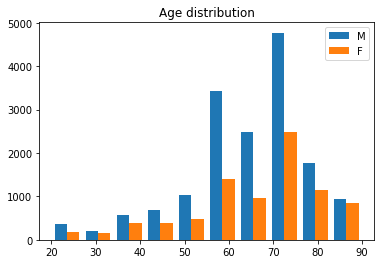

In [9]:
plt.hist([patient_info.loc[patient_info['sex']=='M', 'age'], 
          patient_info.loc[patient_info['sex']=='F', 'age']], label=['M', 'F'])
plt.title('Age distribution')
plt.legend();

# Discharge status

Total alive cases: 23101
Total dead cases: 1551


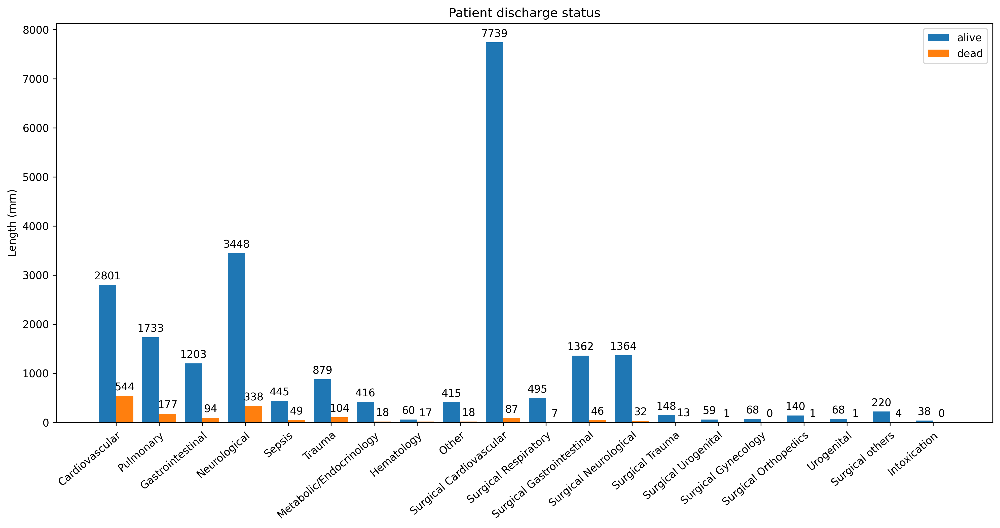

In [10]:
cat = [apache for apache in pid_group]
count_status = {
    'alive': [],
    'dead': [],
}


for apache in pid_group:
    count_status['alive'].append(patient_info.loc[(patient_info['patientid'].isin(pid_group[apache]))
                                                 & (patient_info['discharge_status']=='alive')].shape[0])
    count_status['dead'].append(patient_info.loc[(patient_info['patientid'].isin(pid_group[apache]))
                                                 & (patient_info['discharge_status']=='dead')].shape[0])

x = np.arange(len(cat))  # the label locations
width = 0.4  # the width of the bars
multiplier = 0.5

fig, ax = plt.subplots(figsize=(16,7), dpi=300)

for attribute, measurement in count_status.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Length (mm)')
ax.set_title('Patient discharge status')
ax.set_xticks(x + width, cat, rotation=40, ha='right', rotation_mode='anchor')
ax.legend(loc='upper right')
# ax.set_yscale('log')
print(f"Total alive cases: {patient_info[patient_info['discharge_status']=='alive'].shape[0]}\nTotal dead cases: {patient_info[patient_info['discharge_status']=='dead'].shape[0]}")

# Length of stay

(0.0, 10.0)

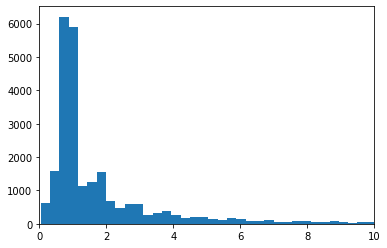

In [11]:
los = patient_info['los'].values
los_in_day = [l.days + l.seconds/3600/24 for l in los]

counts, bins, _ = plt.hist(los_in_day, bins=100);
plt.xlim(0,10)

10%: 0.6291666666666667
20%: 0.7583888888888889
30%: 0.8513020833333332
40%: 0.9138888888888889
50%: 0.9825347222222223
60%: 1.266388888888888
70%: 1.8088831018518516
80%: 2.7118055555555554
90%: 4.810000000000006


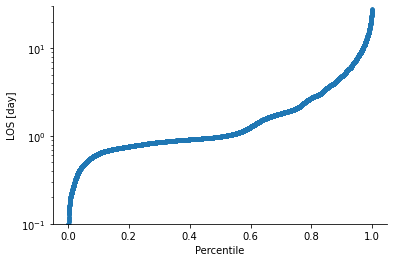

In [12]:
los = patient_info['los'].values
los_in_day = [l.days + l.seconds/3600/24 for l in los]

position, bill = probscale.plot_pos(los_in_day)

# position *= 100
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(position, bill, marker='.', linestyle='none', label='LOS')
ax.set_xlabel('Percentile')
ax.set_ylabel('LOS [day]')
ax.set_yscale('log')
ax.set_ylim(bottom=0.1, top=30)
seaborn.despine()

print(f"10%: {np.percentile(los_in_day, 10)}\n\
20%: {np.percentile(los_in_day, 20)}\n\
30%: {np.percentile(los_in_day, 30)}\n\
40%: {np.percentile(los_in_day, 40)}\n\
50%: {np.percentile(los_in_day, 50)}\n\
60%: {np.percentile(los_in_day, 60)}\n\
70%: {np.percentile(los_in_day, 70)}\n\
80%: {np.percentile(los_in_day, 80)}\n\
90%: {np.percentile(los_in_day, 90)}")

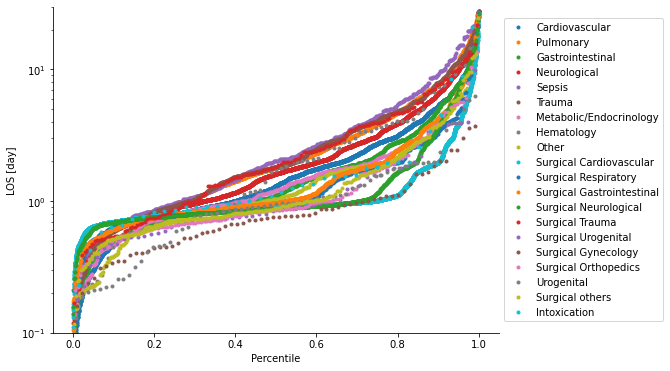

In [13]:
fig, ax = plt.subplots(figsize=(8, 6))

los_per_group = {}
for apache in pid_group:
    los = patient_info.loc[patient_info['patientid'].isin(pid_group[apache]), 'los'].values
    los_ = [l.days + l.seconds/3600/24 for l in los]
    los_per_group[apache] = los_
    
    position, bill = probscale.plot_pos(los_)
    ax.plot(position, bill, marker='.', linestyle='none', label=apache)
    
ax.set_xlabel('Percentile')
ax.set_ylabel('LOS [day]')
ax.set_yscale('log')
ax.set_ylim(bottom=0.1, top=30)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
seaborn.despine()

# Patient data statistics

In [6]:
def percentile(n):
    def percentile_(x):
        return np.nanpercentile(x, n)
    percentile_.__name__ = 'percentile_%s' % n
    return percentile_

In [25]:
# Physio statistics for all patient
gb_physioid = patient_data.groupby(['variableid']).agg({'value': ['mean', 'std', 'median', 'min', 'max',
                                                                  percentile(0.1),
                                                                  percentile(1), percentile(5),
                                                                  percentile(95), percentile(99),
                                                                  percentile(99.9)]})
display(HTML(gb_physioid.to_html()))

In [26]:
# Physio features for individual patients
gb_pid_physioid = patient_data.groupby(['patientid', 'variableid']).agg({'value': ['mean', 'std', 'median', 'min', 'max',
                                                                  percentile(0.1),
                                                                  percentile(1), percentile(5),
                                                                  percentile(95), percentile(99),
                                                                  percentile(99.9)]})

/home/kai/workspace/env/py38-torch/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,


In [97]:
phid = sorted(pharma_data['pharmaid'].unique())
vid = sorted(patient_data['variableid'].unique())
vid_cat = [x for x in [3845, 10000100, 10000200, 10000300,10002508, 15001166, 15001525, 15001552] 
           if x in selected_physio['variable_id'].values]
vid_num = [x for x in vid if x not in vid_cat]

In [71]:
count_pdata = pd.DataFrame(columns=['vid', 'variable_name', 'count'])
for vid_ in tqdm(vid):
    vname = selected_physio.loc[selected_physio['variable_id']==vid_, 'variable_name'].item()
    count_pdata.loc[len(count_pdata)] = {'vid': vid_,
                                         'variable_name': vname, 
                                         'count': patient_data[patient_data['variableid']==vid_].shape[0]}
display(HTML(count_pdata.to_html()))

100%|██████████████████████████████████████████████████████████████████████████████| 73/73 [00:45<00:00,  1.60it/s]


,vid,variable_name,count
0,200,Heart rate,45097853
1,300,Respiratory rate,18679228
2,310,Respiratory rate,15563670
3,320,Ventilator rate,901764
4,400,Axillary temperature,176797
5,410,Core body temperature,4943440
6,2010,Inspired oxygen concentration,17557540
7,2400,Tidal volume setting,880716
8,2410,Expiratory tidal volume,17571486
9,2600,Positive end expiratory pressure setting,2422764


 27%|█████████████████████▎                                                        | 20/73 [01:48<03:54,  4.42s/it]/tmp/ipykernel_58360/3707063673.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,2, figsize=(16, 4), dpi=600)
100%|██████████████████████████████████████████████████████████████████████████████| 73/73 [04:50<00:00,  3.98s/it]


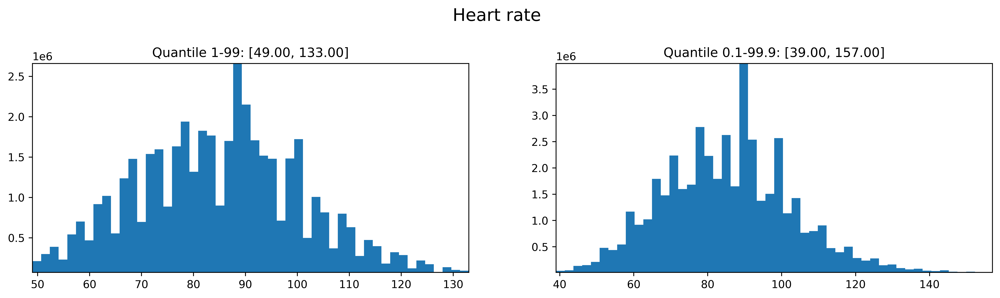

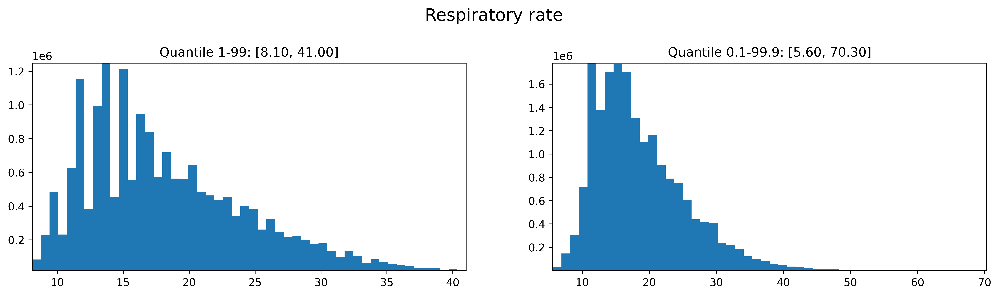

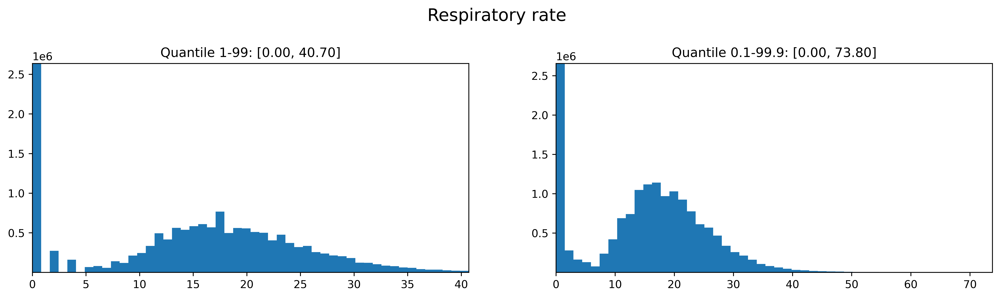

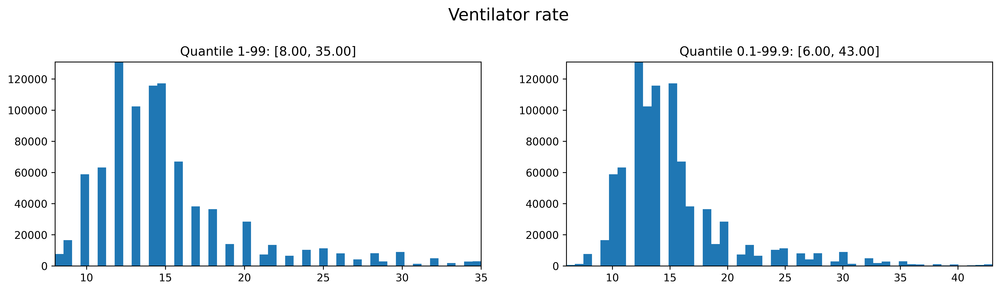

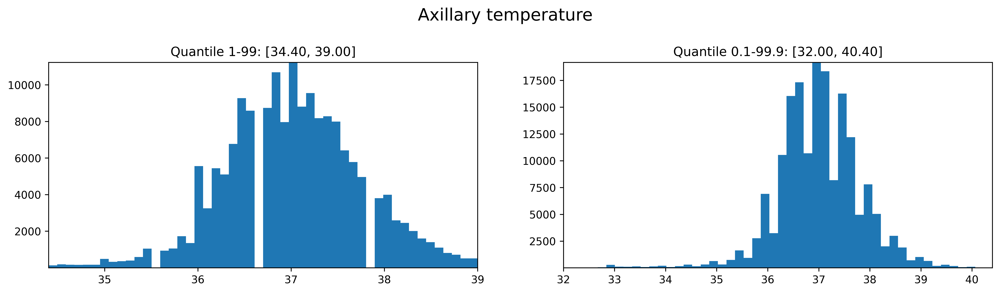

...

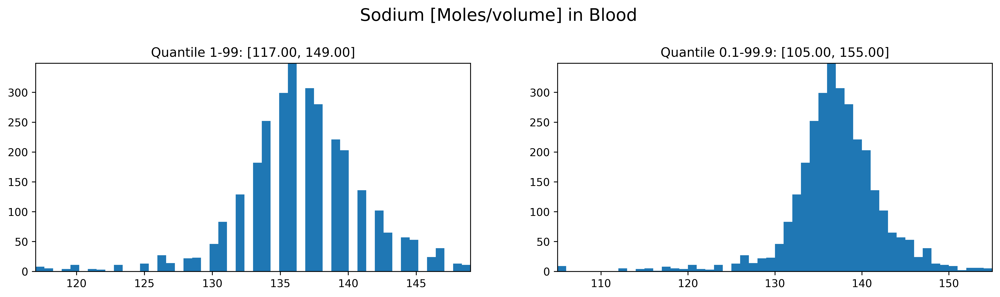

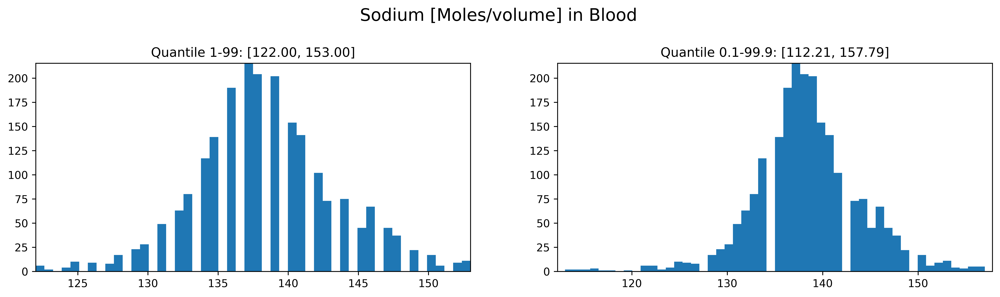

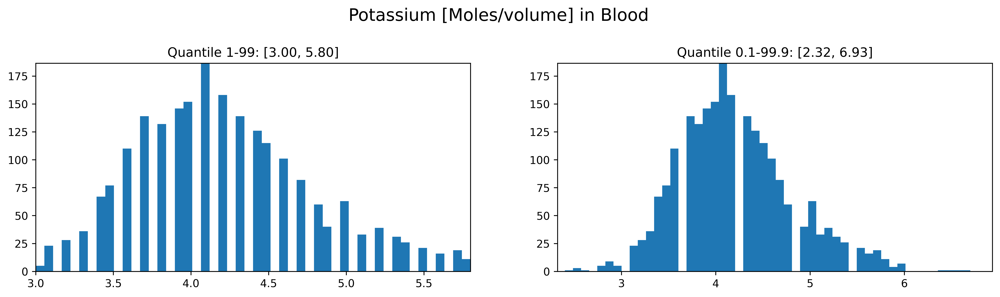

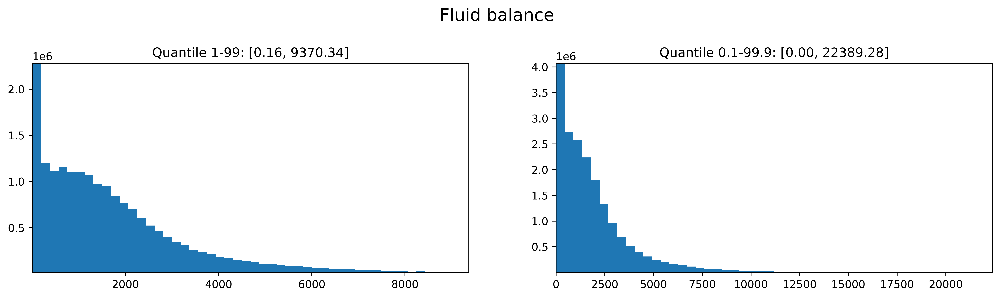

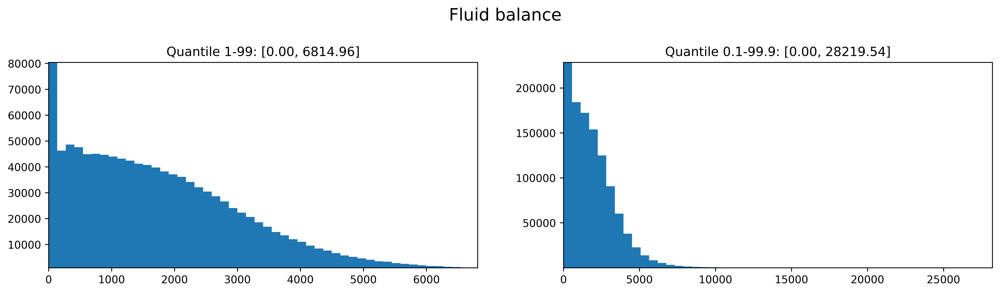

In [92]:
savepath = "../plots/patient_data_histogram"
Path(savepath).mkdir(parents=True, exist_ok=True)

for vid_ in tqdm(vid):
    vname = selected_physio.loc[selected_physio['variable_id']==vid_, 'variable_name'].item()

    data = patient_data.loc[patient_data['variableid']==vid_, 'value']
    plot_lim0 = [np.nanpercentile(data, 1), np.nanpercentile(data, 99)]
    plot_lim1 = [np.nanpercentile(data, .1), np.nanpercentile(data, 99.9)]

    fig, ax = plt.subplots(1,2, figsize=(16, 4), dpi=600)
    plt.subplots_adjust(top=0.8)
    n,_,_ = ax[0].hist(patient_data.loc[(patient_data['variableid']==vid_) &
                                        (patient_data['value']>=plot_lim0[0]) &
                                        (patient_data['value']<=plot_lim0[1]), 
                                        'value'], bins=50);
    ax[0].set_title(f"Quantile 1-99: [{', '.join(f'{lim:.2f}' for lim in plot_lim0)}]");
    ax[0].set_xlim(plot_lim0);
    ax[0].set_ylim(np.percentile(n, 0.1), np.percentile(n, 99.9));
    n,_,_ = ax[1].hist(patient_data.loc[(patient_data['variableid']==vid_) &
                                        (patient_data['value']>=plot_lim1[0]) &
                                        (patient_data['value']<=plot_lim1[1]),  
                                        'value'], bins=50);
    ax[1].set_title(f"Quantile 0.1-99.9: [{', '.join(f'{lim:.2f}' for lim in plot_lim1)}]");
    ax[1].set_xlim(plot_lim1);
    ax[1].set_ylim(np.percentile(n, 0.1), np.percentile(n, 99.9));
    fig.suptitle(vname, fontsize=16)
    
    plt.savefig(os.path.join(savepath, f"{vid_}_{vname.replace(' ', '_').replace('/', '_').replace('.', '')}"))

In [192]:
patient_data[patient_data['variableid'].isin([8280])]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
363358046,2145-11-29 02:02:35.100,2145-11-29 02:02:29.503,24664,4,,,93.000000,8280
363358054,2145-11-29 02:04:46.960,2145-11-29 02:05:18.330,24664,16,,,95.000000,8280
363358065,2145-11-29 02:07:00.090,2145-11-29 02:07:17.440,24664,16,,,95.000000,8280
363358073,2145-11-29 02:09:13.140,2145-11-29 02:09:16.846,24664,16,,,95.000000,8280
454075905,2140-11-25 16:40:45.480,2140-11-25 16:40:42.900,14252,4,,,97.000000,8280
454075916,2140-11-25 16:41:52.400,2140-11-25 16:43:01.896,14252,16,,,96.139999,8280
454075939,2140-11-25 16:44:06.230,2140-11-25 16:45:01.440,14252,16,,,96.000000,8280


In [182]:
selected_pharma[selected_pharma['variable_id']==1000421]

,variable_id,variable_name,category,function
145,1000421,Magnesium Sulfat 50% 10 ml,Electrolytes,affect electrolytes level


In [186]:
pharma_path_all = '../physionet.org/files/hirid/1.1.1/raw_stage/pharma_records_parquet'
pharma_data_all = pd.read_parquet(os.path.join(pharma_path_all, 'pharma_records', 'parquet'))

In [189]:
display(HTML(pharma_data_all[pharma_data_all['patientid']==148].to_html()))

,patientid,pharmaid,givenat,enteredentryat,givendose,cumulativedose,fluidamount_calc,cumulfluidamount_calc,doseunit,route,infusionid,typeid,subtypeid,recordstatus
0,148,1000251,2183-05-12 12:54:00.000,2183-05-12 14:03:39.983,25.000000,25.000000,0.500000,0.500000,µg,iv-inj,1616089,1,8.0,780
1,148,1000251,2183-05-12 12:58:00.000,2183-05-12 14:03:56.576,25.000000,25.000000,0.500000,0.500000,µg,iv-inj,257507,1,8.0,780
2,148,251,2183-05-12 13:02:00.000,2183-05-12 13:57:02.870,1.000000,1.000000,1.000000,1.000000,mg,iv-inj,1997059,1,8.0,780
3,148,1000489,2183-05-12 13:03:00.000,2183-05-12 13:20:26.816,1.000000,1.000000,100.000002,100.000002,g,iv-inf,1023031,1,8.0,780
4,148,251,2183-05-12 13:14:00.000,2183-05-12 13:57:18.620,1.000000,1.000000,1.000000,1.000000,mg,iv-inj,900965,1,8.0,780
5,148,1000251,2183-05-12 13:37:00.000,2183-05-12 14:04:34.670,25.000000,25.000000,0.500000,0.500000,µg,iv-inj,233047,1,8.0,780
6,148,1000251,2183-05-12 13:45:00.000,2183-05-12 14:05:09.216,25.000000,25.000000,0.500000,0.500000,µg,iv-inj,419133,1,8.0,780
7,148,1000251,2183-05-12 14:00:00.000,2183-05-12 14:00:02.943,50.000000,50.000000,1.000000,1.000000,µg,iv-inj,1676174,1,8.0,780
8,148,1000762,2183-05-12 15:31:00.000,2183-05-12 15:31:04.503,2.000000,2.000000,2.000000,2.000000,ml,ep-inj,1069370,1,8.0,780
9,148,1000251,2183-05-12 15:44:00.000,2183-05-12 15:44:02.243,25.000000,25.000000,0.500000,0.500000,µg,iv-inj,1065042,1,8.0,780


# Patient data: Merge, reID, type, shape

In [344]:
# datasheet = pd.read_csv('../processed/helper_physio_dict_preprocess.csv')
# selected_physio_final = pd.read_csv('../processed/HiRID_selected_variables-output_to_be_processed.csv')

# # delete variables with no occurences or unclear meaning
# selected_physio_final = selected_physio_final.drop(
#     selected_physio_final[~selected_physio_final['variableid'].isin(datasheet['variableid'])].index
# ).reset_index(drop=True)

# # label variebles which are set by medical staff
# selected_physio_final['is_setting'] = 0
# selected_physio_final.loc[
#     selected_physio_final['variableid'].isin(datasheet.loc[datasheet['is_setting']==1, 'variableid']), 
#     'is_setting'
# ]=1

# for vid in datasheet['variableid'].values:
#     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'type'] = \
#         datasheet.loc[datasheet['variableid']==vid, 'type'].item()
#     # Shape: B-bell, H-halfBell, M-mixGaussian, D-discrete
#     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'distribution_shape'] = \
#         datasheet.loc[datasheet['variableid']==vid, 'shape'].item()

# # duplicated variables to be merged or added up
# merge_items = {
#     'merge': [
#         [300, 310],
#         [4000, 8280],
#         [24000835, 24000866],
#         [30005010, 30005110],
#     ],
#     'add': [
#         [10010020, 10010070, 10010071, 10010072],
#     ],
# }

# # assign unique ID
# uid = 1
# for vid in selected_physio_final['variableid'].values:
#     dup = False
#     for k in merge_items:
# #         print(k)
#         for vlist in merge_items[k]:
# #             print(vlist)
#             if vid in vlist:
#                 dup = True
#                 tmp = selected_physio_final[selected_physio_final['variableid'].isin(vlist)]
# #                 print(tmp[['variableid', 'uid']])
#                 if tmp['uid'].notnull().sum() == 0:
#                     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'uid'] = uid
#                     uid += 1
# #                     print(f'{vid}: {uid}')
#                     continue
#                 else:
#                     uid_exist = tmp.loc[tmp['uid'].notnull(), 'uid'].unique().item()
#                     selected_physio_final.loc[selected_physio_final['variableid']==vid, 'uid'] = uid_exist
# #                     print(selected_physio_final[selected_physio_final['variableid']==vid])
#                     continue
# #     print(f'after for loop: {vid}, {uid}')
#     if not dup:
#         selected_physio_final.loc[selected_physio_final['variableid']==vid, 'uid'] = uid
#         uid += 1
    
# selected_physio_final.to_csv('../processed/HiRID_selected_variables-output_processed.csv')

In [345]:
# duplicated variables to be merged or added up
merge_items = {
    'merge': [
        [300, 310],
        [4000, 8280],
        [24000835, 24000866],
        [30005010, 30005110],
    ],
    'add': [
        [10010020, 10010070, 10010071, 10010072],
    ],
}

selected_physio_final = pd.read_csv('../processed/HiRID_selected_variables-output_processed.csv')

In [348]:

# remove prelimitary lab values
patient_data.drop(patient_data[patient_data['type']=='P'].index)

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
109664401,2180-11-08 15:20:00,2180-11-08 16:00:16.263,12832,40,5.5.0,P,NaN,20000300
233958801,2131-10-09 03:49:00,2131-10-09 08:14:08.970,22095,8,None,P,7.457,20000300
233958802,2131-10-09 03:49:00,2131-10-09 08:14:06.143,22095,8,None,P,7.457,20000300
423878493,2115-11-14 13:05:00,2115-11-14 13:31:09.786,271,40,!folgt,P,NaN,24000526


In [363]:
idx = 10
patient_data.loc[patient_data['value'].isnull()].iloc[30*idx:30*(idx+1)]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
47786164,2156-01-18 06:00:00,2156-01-19 09:04:35.730,29983,40,< 3,F,NaN,20002200
47984862,2181-03-21 06:00:00,2181-03-21 06:45:55.773,87,40,< 3,F,NaN,20002200
50231412,2181-11-03 05:35:00,2181-11-03 05:40:12.156,25547,40,!fehlt,F,NaN,24000526
50231413,2181-11-03 05:35:00,2181-11-03 05:40:12.453,25547,40,!fehlt,F,NaN,20000200
50231414,2181-11-03 05:35:00,2181-11-03 05:40:53.123,25547,40,!fehlt,F,NaN,20000200
50231415,2181-11-03 05:35:00,2181-11-03 05:40:12.546,25547,40,!fehlt,F,NaN,20000300
50231416,2181-11-03 05:35:00,2181-11-03 05:40:53.186,25547,40,!fehlt,F,NaN,20000300
50231417,2181-11-03 05:35:00,2181-11-03 05:40:53.030,25547,40,!fehlt,F,NaN,24000526
50336996,2141-08-24 02:01:00,2141-08-24 03:49:54.976,27749,40,< 3 mg/L,F,NaN,20002200
51078771,2193-03-19 13:44:00,2193-03-19 15:00:57.800,2485,8,114 mmol/L,F,NaN,20003200


In [370]:
patient_data.loc[(patient_data['variableid']==20003200)&(patient_data['patientid']==2485)].iloc[:30]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
51078771,2193-03-19 13:44:00,2193-03-19 15:00:57.800,2485,8,114 mmol/L,F,NaN,20003200


In [373]:
df_nan = patient_data.loc[patient_data['value'].isnull()]
val_nan = patient_data.loc[patient_data['value'].isnull(), 'stringvalue'].unique()
status_nan = patient_data.loc[patient_data['value'].isnull(), 'status'].unique()

In [388]:
df_nan.shape

(6185, 8)

In [380]:
print(df_nan['patientid'].unique().shape)

for apache in pid_group:
    ocrr = patient_info.loc[patient_info['patientid'].isin(df_nan['patientid'].unique()), 'APACHE'].tolist().count(apache)
    print(f'{apache}: {ocrr}')

(1465,)
Cardiovascular: 213
Pulmonary: 126
Gastrointestinal: 99
Neurological: 546
Sepsis: 18
Trauma: 80
Metabolic/Endocrinology: 94
Hematology: 3
Other: 27
Surgical Cardiovascular: 75
Surgical Respiratory: 12
Surgical Gastrointestinal: 51
Surgical Neurological: 83
Surgical Trauma: 6
Surgical Urogenital: 3
Surgical Gynecology: 1
Surgical Orthopedics: 6
Urogenital: 6
Surgical others: 3
Intoxication: 13


In [390]:
pid_nan = df_nan['patientid'].unique()

idx = 1 
patient_data[patient_data['patientid']==pid_nan[idx]]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
730903,2158-02-20 14:43:01.430,2158-02-20 14:43:05.240,7880,4,,,98.000000,200
730907,2158-02-20 14:43:02.880,2158-02-20 14:43:05.536,7880,4,,,100.000000,4000
730908,2158-02-20 14:43:53.090,2158-02-20 14:45:22.926,7880,16,,,100.000000,200
730912,2158-02-20 14:44:46.090,2158-02-20 14:45:22.973,7880,16,,,100.000000,4000
730913,2158-02-20 14:45:36.100,2158-02-20 14:47:22.506,7880,16,,,98.000000,200
...,...,...,...,...,...,...,...,...
733961,2158-02-21 09:51:16.380,2158-02-21 09:51:25.110,7880,16,,,99.900002,4000
733962,2158-02-21 09:52:57.330,2158-02-21 09:53:25.003,7880,16,,,105.000000,200
733963,2158-02-21 09:52:58.690,2158-02-21 09:53:25.003,7880,16,,,99.900002,4000
733964,2158-02-21 09:53:48.560,2158-02-21 09:55:24.833,7880,16,,,99.000000,200


In [391]:
df_nan[df_nan['patientid']==pid_nan[idx]]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
731148,2158-02-20 16:00:00,2158-02-20 16:28:55.343,7880,40,< 3,F,NaN,20002200
731149,2158-02-20 16:00:00,2158-02-21 01:48:07.186,7880,40,< 3,F,NaN,20002200


In [386]:
df_nan[df_nan['stringvalue']=='!folgt']['status'].unique()

array([40, 42], dtype=int16)

In [389]:
df_nan[df_nan['status']==40].shape

(5195, 8)

In [367]:
val_nan

array(['< 0.1', '< 3', '!folgt', '< 0.003', '35.mmol/L', '193 mm Hg',
       '32 mm Hg', '4.2 mmol/L', '138 mmol/L', '136 mmol/L', '4.3 mmol/L',
       '139 mmol/L', '3.1 mmol/L', '143 mmol/L', '3.7 mmol/L', '< 10',
       '< 0.3', '< 0.8', 'mmol/L', '<3', '< 3 mg/L', '16954 µmol/L',
       '19856 µmol/L', '7836 µmol/L', '!fehlt', '0.114 µg/L',
       '0.095 µg/L', '1621 µmol/L', '3018 µmol/L', '3.8 mmol/L',
       '4.5 mmol/L', '4.0 mmol/L', '4.6 mmol/L', '137 mmol/L',
       '4.9 mmol/L', '142 mmol/L', '4.7 mmol/L', '6242 µmol/L',
       '0.035 µg/L', '0.048 µg/L', '0.013 µg/L', '16 mmol/L',
       '9803 µmol/L', '336.6 mmol/L', '0.022 µg/L', '< 7', '114 mmol/L',
       '< 5', '82 mm Hg', '40 mm Hg', '76 mm Hg', '41 mm Hg', '38 mm Hg',
       '67 mm Hg', '123 mm Hg', '46 mm Hg', '61 mm Hg', '99 mm Hg',
       '71 mm Hg', '93 mm Hg', '42 mm Hg', '68 mm Hg', '86 mm Hg',
       '4.1 mmol/L', '14 mmol/L', '9261 µmol/L', '233.2 mmol/L',
       '0.050 µg/L', '5859 µmol/L', '415.3 mmol/L', 

In [394]:
val_lessthan = [val for val in val_nan if val.startswith('<')]
val

['< 0.1',
 '< 3',
 '< 0.003',
 '< 10',
 '< 0.3',
 '< 0.8',
 '<3',
 '< 3 mg/L',
 '< 7',
 '< 5',
 '< 0.7',
 '< 10 mmol/L',
 '<0.1',
 '< 0.003 µg/L',
 '< 1.0',
 '< 0.3 µg/L',
 '< 0.1 µg/L',
 '< 0.20',
 '< 3 ng/L']

In [371]:
selected_physio[selected_physio['variable_id']==20003200]

,variable_id,variable_name,category
68,20003200,Sodium [Moles/volume] in Urine,Renal


In [372]:
status_nan

array([ 40,   9,   8,  72, 136,  42,  41], dtype=int16)

In [365]:
patient_data.loc[patient_data['value'].isnull()].shape

(6185, 8)

In [366]:
patient_data.shape

(293243582, 8)

# Categorical patient data

### 3845: Ventilator mode - OHK
1	Stand By\
2	DGV\
3	CMV\
4	Druckreg. Vol.Kontr.\
5	Volumenunterstützung\
6	SIMV(CMV)+DU\
7	SIMV(DGV.)+DU\
8	DU/ST\
9	Optional\
10	SIMV-PregVctrl+Psupp\
11	Bi-Vent\
12	NIV DGV\
13	NIV DU\
14	Nasal CPAP\
15	NAVA\
17	NIV neur adj

### 10000100: Glasgow Coma Score verbal response subscore
1 keine\
2 unverständl. Laute\
3 unzu.häng. Worte\
4 Desorientiert\
5 Orientiert

### 10000200: Glasgow Coma Score motor response subscore
1 kein(auf Weckreiz)\
2 abnorme Extension\
3 abnorme Flexion\
4 ungezielte Abwehr\
5 gezielte Abwehr\
6 auf Aufforderung

### 10000300: Glasgow Coma Score eye opening subscore
1 kein(auf Weckreiz)\
2 auf Weckreiz\
3 auf Aufforderung\
4 Spontan

### 15001166 Cardian Rhythm - OHK
1	SR\
2	Sinusbradykardie\
3	Sinustachykardie\
4	Atrial fibrillation\
5	AV-Rhythmus\
6	PM\
7	AV Block Grad 1\
8	AV Block Grad 2\
9	AV Block Grad 3\
10	Vhfli\
11	Vhfla\
12	Kammerrhythmus\
13	Kammerflimmern\
14	Asystolie\
15	Sinusarrhythmie\
16	siehe PD Spez.Rhyth

### 15001525: Oxygen administration by nasal cannula - pure oxygen for patient [L/min]
1	1\
2	2\
3	3\
4	4\
5	5\
6	6\
7	7\
8	2 x 2\
9	2 x 4\
10	2 x 6\
11	8\
14	2 x 3\
15	2 x 5\
16	0\
17	1.5\
18	9

### 15001552: Ventilator Airway Code
1	intubiert\
2	tracheotomiert\
3	Maske\
4	Helm\
5	Mundstück(Stellar)\
6	-

In [99]:
for x in [3845, 10000100, 10000200, 10000300,10002508, 15001166, 15001525, 15001552]:
    if x in selected_physio['variable_id'].values:
        print(f"{x}: {selected_physio[selected_physio['variable_id']==x]['variable_name'].item()}")

3845: Ventilator mode
10000100: Glasgow Coma Score verbal response subscore
10000200: Glasgow Coma Score motor response subscore
10000300: Glasgow Coma Score eye opening subscore
15001166: Circadian rhythm
15001525: Oxygen administration by nasal cannula
15001552: Ventilator Airway Code


In [100]:
len(vid_cat), len(vid_num)

(7, 66)

In [190]:

patient_data[patient_data['variableid']==15001525].iloc[:60]

,datetime,entertime,patientid,status,stringvalue,type,value,variableid
91,2183-05-12 12:49:00,2183-05-12 12:54:50.786,148,8,None,,6.0,15001525
92,2183-05-12 12:49:00,2183-05-12 12:59:41.106,148,8,None,,10.0,15001525
253,2183-05-12 13:02:00,2183-05-12 13:02:51.476,148,8,None,,10.0,15001525
719,2183-05-12 13:52:00,2183-05-12 13:54:09.566,148,8,None,,18.0,15001525
840,2183-05-12 14:05:00,2183-05-12 14:05:52.963,148,8,None,,6.0,15001525
868,2183-05-12 14:08:00,2183-05-12 14:14:35.463,148,8,None,,4.0,15001525
963,2183-05-12 14:18:00,2183-05-12 14:30:49.760,148,8,None,,3.0,15001525
1393,2183-05-12 15:26:00,2183-05-12 15:26:27.386,148,8,None,,2.0,15001525
1565,2183-05-12 16:00:00,2183-05-12 16:22:04.123,148,8,None,,2.0,15001525
2059,2183-05-12 18:16:00,2183-05-12 18:16:42.390,148,8,None,,2.0,15001525


In [90]:
display(HTML(selected_physio.to_html()))

,variable_id,variable_name,category
0,4000,Peripheral oxygen saturation,Respiratory
1,8280,Peripheral oxygen saturation,Respiratory
2,300,Respiratory rate,Respiratory
3,310,Respiratory rate,Respiratory
4,5685,Respiratory rate,Respiratory
5,15001555,Oxygen administration by mask,Respiratory
6,15001525,Oxygen administration by nasal cannula,Respiratory
7,2010,Inspired oxygen concentration,Respiratory
8,2600,Positive end expiratory pressure setting,Respiratory
9,2610,Positive end expiratory pressure,Respiratory


In [43]:
diff = gb_physioid[('value', 'mean')] - gb_physioid[('value', 'median')]
gb_physioid[diff > 0.2 * gb_physioid[('value', 'median')]]

value                                          \
                    mean           std       median          min   
variableid                                                         
2600        6.641442e+00  2.285526e+00     5.000000     0.000000   
2610        6.538540e+00  2.288963e+00     5.300000     0.000000   
3845        2.899323e+00  3.055444e+00     1.000000     1.000000   
5685        4.319032e+02  1.149319e+03    80.599998     0.000000   
7887        1.346878e+00  1.557848e+00     1.000000     0.000000   
10010071    7.322479e+00  7.705564e+00     6.000000   -13.000000   
15001166    2.766592e+00  3.131210e+00     1.000000     1.000000   
15001525    5.342522e+00  4.730153e+00     4.000000     1.000000   
15001552    1.358833e+00  6.698467e-01     1.000000     1.000000   
15001555    1.068263e+03  3.436022e+05     6.000000     0.000000   
15001565   -1.149749e+00  3.019172e+00    -1.000000   -74.000000   
20000600    1.180281e+02  9.890223e+01    84.000000     0.000000   
20002200    1.100387e+02  9.555787e+01    81.000000     3.000000   
20004100    1.076893e+01  7.774519e+00     8.300000     0.500000   
24000210    1.277425e+03  6.522770e+03   363.000000     4.000000   
24000220    3.511333e+01  9.274620e+01    11.100000     0.400000   
24000480    2.101965e-01  3.904608e+01     0.000000     0.000000   
24000524    1.941504e+00  2.004941e+00     1.400000     0.000000   
24000557    2.531398e+01  1.799744e+01    21.000000     0.000000   
24000569    7.595144e+03  1.517808e+04  2177.000000     6.000000   
24000570    8.455647e+00  3.108257e+01     1.420000     0.100000   
24000572    6.380173e+03  4.926681e+03  5107.000000    89.000000   
24000754    1.539347e+02  1.113648e+02   121.900002     1.000000   
24000806    1.268150e+03  6.661762e+03   350.000000     0.065000   
30005010    8.767952e+26  2.843753e+29  1357.484619     0.000000   
30005110    2.725939e+14  5.014143e+16  1591.530273 -1388.984009   

                                                                   \
                     max percentile_0.1 percentile_1 percentile_5   
variableid                                                          
2600        1.000000e+02          1.000     5.000000     5.000000   
2610        5.010000e+01          0.100     4.100000     4.500000   
3845        1.500000e+01          1.000     1.000000     1.000000   
5685        1.519120e+04          0.000     0.600000     4.800000   
7887        5.000000e+00          0.000     0.000000     0.000000   
10010071    5.000000e+02          0.000     0.000000     0.000000   
15001166    1.600000e+01          1.000     1.000000     1.000000   
15001525    1.800000e+01          1.000     1.000000     1.000000   
15001552    6.000000e+00          1.000     1.000000     1.000000   
15001555    1.111111e+08          0.000     0.000000     0.000000   
15001565    2.000000e+03         -5.000    -5.000000    -5.000000   
20000600    2.175000e+03         21.000    31.000000    42.000000   
20002200    6.480000e+02          3.000     4.000000     8.000000   
20004100    9.840000e+01          1.100     2.000000     3.000000   
24000210    2.727080e+05          9.000    15.000000    33.000000   
24000220    3.064000e+03          0.500     0.900000     1.900000   
24000480    8.021000e+03          0.000     0.000000     0.000000   
24000524    4.000000e+01          0.400     0.500000     0.600000   
24000557    9.250000e+01          0.000     0.000000     3.000000   
24000569    1.520900e+05          6.036     8.000000    14.000000   
24000570    7.066000e+02          0.100     0.110000     0.150000   
24000572    3.963100e+04        229.789   595.920000  1180.000000   
24000754    9.082000e+02          1.090    15.138000    33.445001   
24000806    7.880000e+05          4.000     6.000000    16.000000   
30005010    9.223372e+31          0.000     0.163333    18.110277   
30005110    9.223372e+18          0.000     0.000000    17.507604   

                                            

In [40]:
idx = pd.IndexSlice
gb_physioid[:, idx[:,'mean']]

InvalidIndexError: (slice(None, None, None), (slice(None, None, None), 'mean'))

In [27]:
gb_physioid.columns

MultiIndex([('value',            'mean'),
            ('value',             'std'),
            ('value',          'median'),
            ('value',             'min'),
            ('value',             'max'),
            ('value',  'percentile_0.1'),
            ('value',    'percentile_1'),
            ('value',    'percentile_5'),
            ('value',   'percentile_95'),
            ('value',   'percentile_99'),
            ('value', 'percentile_99.9')],
           )

In [17]:
pd.isnull(gb_pid_physioid).sum()

value  mean               986
       median             986
       min                986
       max                986
       percentile_0.1     986
       percentile_1       986
       percentile_5       986
       percentile_95      986
       percentile_99      986
       percentile_99.9    986
dtype: int64

In [18]:
gb_pid_physioid.shape

(1045611, 10)

In [21]:
gb_pid_physioid.iloc[:30]

value                                       \
                            mean      median         min          max   
patientid variableid                                                    
1         200          89.655174   89.000000   78.000000   106.000000   
          300          19.159639   19.000000    9.500000    31.000000   
          310          14.425949   16.950001    0.000000    26.799999   
          320          15.357142   15.000000   13.000000    17.000000   
          2010         47.122150   40.349998   34.799999    99.900002   
          2400        500.000000  500.000000  450.000000   550.000000   
          2410        607.873413  560.500000  144.000000  1114.000000   
          2600          6.869565    8.000000    5.000000     8.000000   
          2610          6.579114    7.400000    4.300000     8.400000   
          3000         11.017721   11.400000    7.200000    16.700001   
          3110         24.036709   22.600000   15.200000    38.200001   
          3200         16.764198   16.700001    8.500000    21.700001   
          3845          1.675000    1.000000    1.000000     8.000000   
          4000         99.594711  100.000000   79.000000   100.000000   
          10000100      4.600000    5.000000    4.000000     5.000000   
          10000200      6.000000    6.000000    6.000000     6.000000   
          10000300      3.600000    4.000000    3.000000     4.000000   
          15001166      1.454545    1.000000    1.000000     6.000000   
          15001525      2.000000    2.000000    2.000000     2.000000   
          15001552      1.000000    1.000000    1.000000     1.000000   
          15001565     -1.428571   -1.000000   -5.000000     0.000000   
          20000200    161.333328  163.000000  123.000000   196.000000   
          20000300      7.348166    7.345000    7.308000     7.426000   
          20000400    138.166672  138.000000  136.000000   140.000000   
          20000500      4.516667    4.500000    4.300000     4.900000   
          20000600    106.000000  106.000000  106.000000   106.000000   
          20000700      7.014286    7.900000    4.800000     7.900000   
          20001200     40.666668   38.000000   37.000000    47.000000   
          20001300     -3.200000   -3.450000   -4.700000     0.000000   
          20002200     48.000000   48.000000   48.000000    48.000000   

                                                                             \
                     percentile_0.1 percentile_1 percentile_5 percentile_95   
patientid variableid                                                          
1         200               78.4630    80.000000    82.150000     99.000000   
          300                9.7475    11.195000    12.025000     25.600000   
          310                0.0000     0.000000     0.000000     25.130000   
          320               13.0000    13.000000    13.000000     17.000000   
          2010              34.8157    34.900002    35.084999     60.614999   
          2400             450.0000   450.000000   450.000000    550.000000   
          2410             155.3040   331.140000   442.550000    832.600000   
          2600               5.0000     5.000000     5.000000      8.000000   
          2610               4.3000     4.300000     4.400000      8.015000   
          3000               7.2471     7.557000     7.700000     15.130000   
          3110              15.2314    15.457000    15.585000     35.060000   
          3200               8.6360     9.860000    11.100000     21.200001   
          3845               1.0000     1.000000     1.000000      8.000000   
          4000              83.0770    94.530000    98.000000    100.000000   
          10000100           4.0000     4.000000     4.000000      5.000000   
          10000200           6.0000     6.000000     6.000000      6.000000   
          10000300           3.0000     3.000000     3.000000      4.000000   
          15001166           1.0000  

In [22]:
gb_pid_physioid.query('variableid == 20002200')

value                                      \
                            mean median    min    max percentile_0.1   
patientid variableid                                                   
1         20002200     48.000000   48.0   48.0   48.0           48.0   
2         20002200     96.263161   83.0   34.0  156.0           34.0   
3         20002200     32.000000   32.0   32.0   32.0           32.0   
7         20002200    233.600006  250.5   98.0  343.0           98.0   
8         20002200     68.000000   68.0   68.0   68.0           68.0   
...                          ...    ...    ...    ...            ...   
33898     20002200    134.703705  114.0  105.0  191.0          105.0   
33899     20002200    262.000000  262.0  262.0  262.0          262.0   
33901     20002200     81.821426   82.0   63.0   96.0           63.0   
33902     20002200     59.000000   59.0   59.0   59.0           59.0   
33904     20002200    151.166672  148.0   73.0  227.0           73.0   

                                                                            \
                     percentile_1 percentile_5 percentile_95 percentile_99   
patientid variableid                                                         
1         20002200           48.0        48.00          48.0          48.0   
2         20002200           34.0        34.00         156.0         156.0   
3         20002200           32.0        32.00          32.0          32.0   
7         20002200           98.0        98.00         343.0         343.0   
8         20002200           68.0        68.00          68.0          68.0   
...                           ...          ...           ...           ...   
33898     20002200          105.0       105.00         191.0         191.0   
33899     20002200          262.0       262.00         262.0         262.0   
33901     20002200           63.0        65.10          96.0          96.0   
33902     20002200           59.0        59.00          59.0          59.0   
33904     20002200           73.0        74.05         227.0         227.0   

                                      
                     percentile_99.9  
patientid variableid                  
1         20002200              48.0  
2         20002200             156.0  
3         20002200              32.0  
7         20002200             343.0  
8         20002200              68.0  
...                              ...  
33898     20002200             191.0  
33899     20002200             262.0  
33901     20002200              96.0  
33902     20002200              59.0  
33904     20002200             227.0  

[22364 rows x 10 columns]

In [13]:
patient_info['discharge_status'].unique()

array(['alive', 'dead'], dtype=object)

In [14]:
patient_info['sex'].unique()

array(['M', 'F'], dtype=object)

In [11]:
pd.get_dummies(patient_info['sex'])

,F,M
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
33900,0,1
33901,1,0
33902,0,1
33903,1,0
